# Two-View 3D Reconstruction

This notebook implements a simple two-view Structure from Motion approach to create a 3D reconstruction from two images (01.jpg and 02.jpg).

## Setup and Requirements

In [19]:
# Install required packages
!pip install networkx matplotlib tqdm opencv-python plotly scikit-learn nbformat 

In [20]:
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
import warnings
warnings.filterwarnings('ignore')

# For displaying Open3D visualizations in notebooks
import base64
from IPython.display import HTML

# Import plotly for better 3D visualization
import plotly.graph_objects as go
import plotly.express as px

def display_open3d_to_notebook(vis, width=900, height=600):
    vis.update_renderer()
    image = vis.capture_screen_float_buffer()
    image_array = np.asarray(image)
    image_array = (image_array * 255).astype(np.uint8)
    image_array = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
    _, encoded_img = cv2.imencode('.png', image_array)
    encoded_img = base64.b64encode(encoded_img)
    html = f'<img src="data:image/png;base64,{encoded_img.decode()}" width="{width}" height="{height}"/>'
    return HTML(html)

## 1. Data Loading

First, let's load our two specific images: 01.jpg and 02.jpg.

In [21]:
# Check if the images directory exists, if not, create it and download the images
if not os.path.exists("images"):
    os.makedirs("images")
    !wget -r -np -nH --cut-dirs=3 -A jpg -P images https://raw.githubusercontent.com/VarunBurde/Prague_ml/main/images/

# Check if K.txt exists, if not, download it
if not os.path.exists("K.txt"):
    !wget https://raw.githubusercontent.com/VarunBurde/Prague_ml/main/K.txt

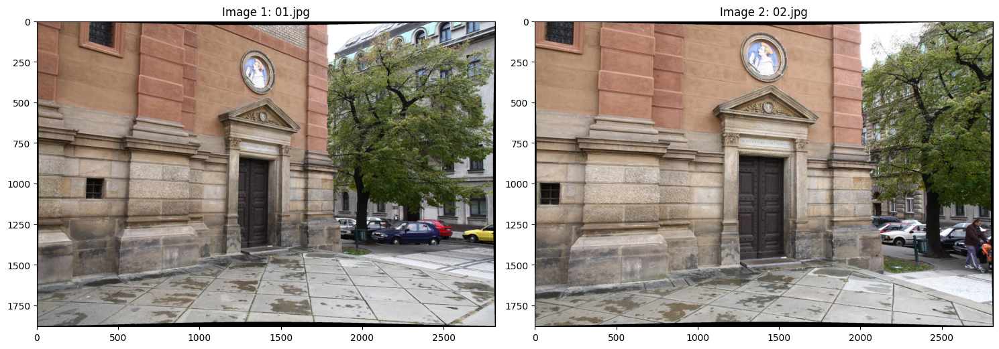

In [22]:
# For Colab: Upload images
import shutil

# Set the paths for our specific images
img_path = "images"
image_paths = [os.path.join(img_path, "01.jpg"), os.path.join(img_path, "02.jpg")]
K = np.loadtxt("K.txt")

plt.figure(figsize=(15, 7))
for i, path in enumerate(image_paths):
    plt.subplot(1, 2, i+1)
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f"Image {i+1}: {os.path.basename(path)}")
plt.tight_layout()
plt.show()

## 2. Load Images and Extract Features

Now we'll load our two images and extract feature points using SIFT.

In [23]:
# Load our two images
images = []
images_rgb = []

for path in image_paths:
    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)
    images_rgb.append(img_rgb)

print(f"Loaded {len(images)} images")

# Create SIFT detector with more aggressive parameters for denser features
sift = cv2.SIFT_create(
    nfeatures=0,  # No limit on number of features
    contrastThreshold=0.04,  # Lower threshold for more features
    edgeThreshold=10,  # Higher threshold for more features
    sigma=1.6  # Default sigma
)

Loaded 2 images


In [24]:
# Detect features in both images
all_kp = []
all_des = []

for i, img_rgb in enumerate(images_rgb):
    img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    img_eq = cv2.equalizeHist(img_gray)
    
    # Detect features at multiple scales
    kp_standard, des_standard = sift.detectAndCompute(img_rgb, None)
    kp_eq, des_eq = sift.detectAndCompute(img_eq, None)
    
    # Combine features
    if des_standard is not None and des_eq is not None:
        kp = kp_standard + kp_eq
        des = np.vstack((des_standard, des_eq))
    elif des_standard is not None:
        kp = kp_standard
        des = des_standard
    elif des_eq is not None:
        kp = kp_eq
        des = des_eq
    else:
        kp = []
        des = np.array([])
    
    all_kp.append(kp)
    all_des.append(des)
    print(f"Image {i+1} ({os.path.basename(image_paths[i])}): Detected {len(kp)} keypoints")

Image 1 (01.jpg): Detected 92881 keypoints
Image 2 (02.jpg): Detected 86036 keypoints
Image 2 (02.jpg): Detected 86036 keypoints


### Visualize Detected Features

Let's visualize the keypoints detected in both images.

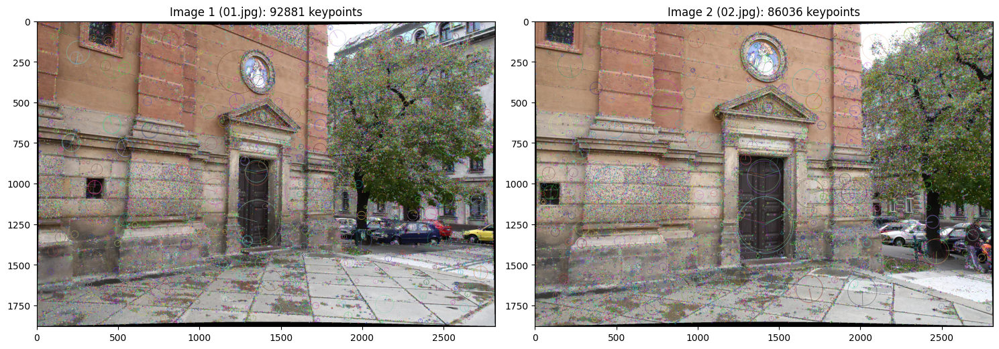

In [25]:
# Display keypoints on both images
plt.figure(figsize=(15, 7))
for i in range(2):
    plt.subplot(1, 2, i+1)
    img_with_kp = cv2.drawKeypoints(images_rgb[i], all_kp[i], None, 
                                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_with_kp)
    plt.title(f"Image {i+1} ({os.path.basename(image_paths[i])}): {len(all_kp[i])} keypoints")
plt.tight_layout()
plt.show()

## 3. Match Features Between Images

Now we'll match features between our two images to find correspondences.

In [26]:
# Improved FLANN matcher setup
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=100)  # More checks for better accuracy
flann = cv2.FlannBasedMatcher(index_params, search_params)

# Function to perform feature matching with cross-check
def match_features(des1, des2, lowes_ratio=0.75, cross_check=True):
    # Forward matching (img1 -> img2)
    if des1 is None or des2 is None or len(des1) == 0 or len(des2) == 0:
        return []
    
    matches12 = flann.knnMatch(des1, des2, k=2)
    good_matches12 = []
    for m, n in matches12:
        if m.distance < lowes_ratio * n.distance:
            good_matches12.append(m)
    
    if not cross_check:
        return good_matches12
    
    # Backward matching (img2 -> img1) for cross-check
    matches21 = flann.knnMatch(des2, des1, k=2)
    good_matches21 = []
    for m, n in matches21:
        if m.distance < lowes_ratio * n.distance:
            good_matches21.append(m)
    
    # Cross-check: keep matches that are consistent in both directions
    cross_matches = []
    for match12 in good_matches12:
        for match21 in good_matches21:
            # Check if match is consistent in both directions
            if match12.queryIdx == match21.trainIdx and match12.trainIdx == match21.queryIdx:
                cross_matches.append(match12)
                break
    
    return cross_matches

# Get matched points from keypoints and matches
def get_matched_points(kp1, kp2, matches):
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    return pts1, pts2

In [27]:
# Match features between our two images (01.jpg and 02.jpg)
idx1, idx2 = 0, 1  # Using image indices 0 and 1 (01.jpg and 02.jpg)
good_matches = match_features(all_des[idx1], all_des[idx2], lowes_ratio=0.75)
print(f"Found {len(good_matches)} good matches between {os.path.basename(image_paths[0])} and {os.path.basename(image_paths[1])}")

Found 2893 good matches between 01.jpg and 02.jpg


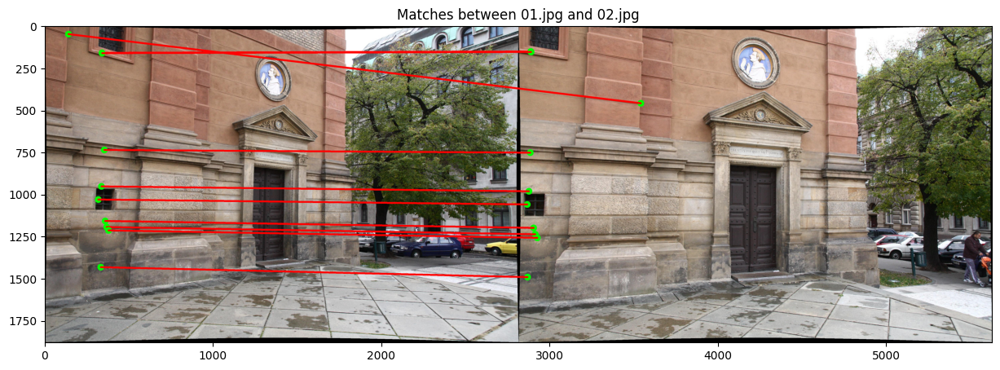

In [28]:

# # Display matches for verification
# match_img = cv2.drawMatches(
#     images_rgb[idx1], all_kp[idx1], 
#     images_rgb[idx2], all_kp[idx2], 
#     good_matches[:100], None, 
#     flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
# )

#or

img1 = images_rgb[idx1]
img2 = images_rgb[idx2]
h1, w1 = img1.shape[:2]
h2, w2 = img2.shape[:2]
matched_img = np.zeros((max(h1, h2), w1 + w2, 3), dtype=np.uint8)
matched_img[:h1, :w1] = img1
matched_img[:h2, w1:w1 + w2] = img2

# Draw keypoints
for m in good_matches[:10]:
    pt1 = tuple(map(int, all_kp[idx1][m.queryIdx].pt))
    pt2 = tuple(map(int, all_kp[idx2][m.trainIdx].pt))
    pt2 = (int(pt2[0] + w1), int(pt2[1]))  # shift pt2 x-coord

    # Draw circles
    cv2.circle(matched_img, pt1, 20, (0, 255, 0), -1)  # radius 6, green
    cv2.circle(matched_img, pt2, 20, (0, 255, 0), -1)

    # Draw connecting line
    cv2.line(matched_img, pt1, pt2, (255, 0, 0),10)  # blue line, thickness 2

plt.figure(figsize=(15, 10))
plt.imshow(matched_img)
plt.title(f'Matches between {os.path.basename(image_paths[0])} and {os.path.basename(image_paths[1])}')
plt.show()

## 4. Two-View Reconstruction

Now we'll use the matched features to perform 3D reconstruction.

In [29]:
# Initialize camera poses (R|t) for each image
# First camera (01.jpg) is at origin with identity rotation
camera_poses = [np.hstack((np.eye(3), np.zeros((3, 1))))]
camera_matrices = [K @ camera_poses[0]]

# Structure to store 3D points and their 2D observations
point_cloud = []
point_colors = []

pts1, pts2 = get_matched_points(all_kp[idx1], all_kp[idx2], good_matches)

# Calculate essential matrix with robust parameters
E, mask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=2.0)

# Recover pose for second camera (02.jpg)
_, R, t, mask = cv2.recoverPose(E, pts1, pts2, K, mask=mask)

# Set second camera pose
camera_poses.append(np.hstack((R, t)))
camera_matrices.append(K @ camera_poses[1])

print(f"Camera 1 (01.jpg) pose:\n{camera_poses[0]}")
print(f"\nCamera 2 (02.jpg) pose:\n{camera_poses[1]}")

# Filter points using mask
mask = mask.ravel() == 1
pts1_good = pts1[mask]
pts2_good = pts2[mask]

print(f"\nUsing {np.sum(mask)} inlier matches for triangulation")

Camera 1 (01.jpg) pose:
[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]]

Camera 2 (02.jpg) pose:
[[ 9.61438125e-01  2.36378353e-02  2.74003622e-01 -9.25695056e-01]
 [-2.47843580e-02  9.99692559e-01  7.22832212e-04 -2.86111153e-03]
 [-2.73902296e-01 -7.48596231e-03  9.61728388e-01 -3.78259802e-01]]

Using 2723 inlier matches for triangulation


In [30]:
# Triangulate points
pts1_good = pts1_good.reshape(-1, 2).T
pts2_good = pts2_good.reshape(-1, 2).T
points_4D = cv2.triangulatePoints(camera_matrices[0], camera_matrices[1], pts1_good, pts2_good)
points_3D = points_4D / points_4D[3]  # Convert to Cartesian
points_3D = points_3D[:3, :].T

# Filter points by depth
valid_points = []
valid_colors = []

for i in range(points_3D.shape[0]):
    point = points_3D[i]
    # Check if point is in front of both cameras
    if point[2] > 0:
        # Get corresponding 2D points
        x1, y1 = pts1_good[:, i]
        
        # Extract color from first image
        x1_int, y1_int = int(round(x1)), int(round(y1))
        if 0 <= x1_int < images_rgb[idx1].shape[1] and 0 <= y1_int < images_rgb[idx1].shape[0]:
            color = images_rgb[idx1][y1_int, x1_int] / 255.0
            valid_points.append(point)
            valid_colors.append(color)

point_cloud = np.array(valid_points)
point_colors = np.array(valid_colors)

print(f"Reconstructed point cloud has {len(point_cloud)} points")

Reconstructed point cloud has 2723 points


### Visualize Point Cloud
Let's visualize the 3D point cloud reconstructed from our two images using Plotly, which provides interactive 3D visualization capabilities.

In [31]:
# Filter the point cloud to remove outliers
def remove_statistical_outliers(points, colors, nb_neighbors=20, std_ratio=2.0):
    """Remove outliers from point cloud based on statistical analysis of neighbors"""
    # Calculate mean and std of distances for each point
    from sklearn.neighbors import NearestNeighbors
    import numpy as np
    
    # Find k-nearest neighbors for each point
    nbrs = NearestNeighbors(n_neighbors=nb_neighbors).fit(points)
    distances, indices = nbrs.kneighbors(points)
    
    # Calculate mean distances
    mean_dists = np.mean(distances, axis=1)
    global_mean = np.mean(mean_dists)
    global_std = np.std(mean_dists)
    threshold = global_mean + std_ratio * global_std
    
    # Filter points based on threshold
    mask = mean_dists < threshold
    filtered_points = points[mask]
    filtered_colors = colors[mask] if colors is not None else None
    
    print(f"Removed {len(points) - len(filtered_points)} outliers from {len(points)} points")
    return filtered_points, filtered_colors

# Apply statistical outlier removal to clean up point cloud
point_cloud_filtered, point_colors_filtered = remove_statistical_outliers(point_cloud, point_colors)

Removed 72 outliers from 2723 points


In [32]:
# Function to visualize point cloud with plotly
def visualize_point_cloud_plotly(points, colors=None, point_size=2):
    """Create interactive 3D visualization of point cloud using Plotly"""
    if colors is None:
        # Default color if none provided
        fig = px.scatter_3d(x=points[:, 0], y=points[:, 1], z=points[:, 2],
                           opacity=0.8, size_max=point_size)
    else:
        # Convert RGB colors (0-1) to hex strings for plotly
        color_str = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' for r, g, b in colors]
        
        fig = go.Figure(data=[go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(
                size=point_size,
                color=color_str,
                opacity=0.8
            )
        )])
    
    # Improve layout for better visualization
    fig.update_layout(
        scene=dict(
            xaxis=dict(visible=True, showticklabels=True, showbackground=True, backgroundcolor='rgb(230, 230, 230)'),
            yaxis=dict(visible=True, showticklabels=True, showbackground=True, backgroundcolor='rgb(230, 230, 230)'),
            zaxis=dict(visible=True, showticklabels=True, showbackground=True, backgroundcolor='rgb(230, 230, 230)')
        ),
        width=900,
        height=700,
        margin=dict(l=0, r=0, b=0, t=30),
        title="3D Point Cloud Reconstruction",
    )
    
    return fig

In [33]:
# Visualize our point cloud with Plotly
# Filter out any potential NaN values
valid_mask = ~np.isnan(point_cloud_filtered).any(axis=1)
points_filtered = point_cloud_filtered[valid_mask]
colors_filtered = point_colors_filtered[valid_mask] if point_colors_filtered is not None else None

# Create and display the figure
fig = visualize_point_cloud_plotly(points_filtered, colors_filtered, point_size=1.5)
fig.show()

### Visualize Point Cloud with Camera Positions

Let's visualize the 3D point cloud along with the positions of the two cameras for better context.

In [34]:
def visualize_scene_with_cameras(points, colors, camera_poses, scale=0.2):
    """Visualize 3D points and camera positions in a single plot"""
    # Camera positions in world coordinates
    camera_positions = []
    camera_rotations = []
    
    for i, pose in enumerate(camera_poses):
        R = pose[:, :3]
        t = pose[:, 3]
        
        # Camera center (C = -R^T * t)
        if i == 0:  # First camera at origin
            center = np.array([0, 0, 0])
        else:       # Other cameras
            center = -R.T @ t
        
        camera_positions.append(center)
        camera_rotations.append(R)
    
    # Create figure
    fig = go.Figure()
    
    # Add 3D points
    color_str = [f'rgb({int(r*255)},{int(g*255)},{int(b*255)})' for r, g, b in colors]
    fig.add_trace(go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1], 
        z=points[:, 2],
        mode='markers',
        marker=dict(
            size=1,
            color=color_str,
            opacity=0.7
        ),
        name='3D Points'
    ))
    
    # Add cameras
    for i, (center, R) in enumerate(zip(camera_positions, camera_rotations)):
        # Camera position
        fig.add_trace(go.Scatter3d(
            x=[center[0]], 
            y=[center[1]], 
            z=[center[2]],
            mode='markers+text',
            marker=dict(size=10, color=f'rgb(255,{50*i},{50*i})'),
            text=[f'Camera {i+1}'],
            name=f'Camera {i+1}'
        ))
        
        # Camera axes
        # Create camera coordinate axes
        axes_length = scale
        axes_colors = ['red', 'green', 'blue']
        
        for axis in range(3):
            # Direction is given by the rotation matrix columns
            direction = R[:, axis] * axes_length
            
            # Draw axis line
            fig.add_trace(go.Scatter3d(
                x=[center[0], center[0] + direction[0]],
                y=[center[1], center[1] + direction[1]],
                z=[center[2], center[2] + direction[2]],
                mode='lines',
                line=dict(color=axes_colors[axis], width=3),
                showlegend=False
            ))
    
    # Setup layout
    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='data'
        ),
        width=900,
        height=700,
        title="3D Scene with Cameras and Point Cloud"
    )
    
    return fig

In [35]:
# Visualize point cloud with camera positions
fig = visualize_scene_with_cameras(points_filtered, colors_filtered, camera_poses, scale=0.5)
fig.show()